## Models

### Import Required Libraries

In [1]:
import matplotlib.pyplot as plotter_lib
import pandas as pd
import numpy as np
import PIL as image_lib
import tensorflow as tflow
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

### Partition and Visualize Data

In [2]:
import pandas as pd


df = pd.read_csv('../data/df.csv', sep = '\t')

df['combined'] = df['gender'] + "_" + df['subCategory'] + "_" + df['articleType'] + "_" + \
                 df['baseColour'] + "_" + df['season'] + "_" + df['usage']

df

,id,gender,subCategory,articleType,baseColour,season,usage,image_path,gender_enc,subCategory_enc,articleType_enc,baseColour_enc,season_enc,usage_enc,combined
0,15970,Men,Topwear,Shirts,Navy Blue,Fall/Winter,Casual,../data/images/15970.jpg,2,1,6,10,0,0,Men_Topwear_Shirts_Navy Blue_Fall/Winter_Casual
1,39386,Men,Bottomwear,Jeans,Blue,Spring/Summer,Casual,../data/images/39386.jpg,2,0,2,2,1,0,Men_Bottomwear_Jeans_Blue_Spring/Summer_Casual
2,21379,Men,Bottomwear,Track Pants,Black,Fall/Winter,Casual,../data/images/21379.jpg,2,0,12,1,0,0,Men_Bottomwear_Track Pants_Black_Fall/Winter_C...
3,53759,Men,Topwear,Tshirts,Grey,Spring/Summer,Casual,../data/images/53759.jpg,2,1,14,7,1,0,Men_Topwear_Tshirts_Grey_Spring/Summer_Casual
4,1855,Men,Topwear,Tshirts,Grey,Spring/Summer,Casual,../data/images/1855.jpg,2,1,14,7,1,0,Men_Topwear_Tshirts_Grey_Spring/Summer_Casual
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54338,13671,Unisex,Bottomwear,Jeans,Blue,Fall/Winter,Casual,../data/images/13671.jpg,3,0,2,2,0,0,Unisex_Bottomwear_Jeans_Blue_Fall/Winter_Casual
54339,33279,Unisex,Bottomwear,Jeans,Blue,Spring/Summer,Casual,../data/images/33279.jpg,3,0,2,2,1,0,Unisex_Bottomwear_Jeans_Blue_Spring/Summer_Casual
54340,13672,Unisex,Bottomwear,Jeans,Blue,Fall/Winter,Casual,../data/images/13672.jpg,3,0,2,2,0,0,Unisex_Bottomwear_Jeans_Blue_Fall/Winter_Casual
54341,33280,Unisex,Bottomwear,Jeans,Blue,Spring/Summer,Casual,../data/images/33280.jpg,3,0,2,2,1,0,Unisex_Bottomwear_Jeans_Blue_Spring/Summer_Casual


In [3]:
from sklearn.model_selection import train_test_split


df['combined'] = df['gender'] + "_" + df['subCategory'] + "_" + df['articleType'] + "_" + df['baseColour'] + "_" + \
                 df['season'] + "_" + df['usage']

In [4]:
from sklearn.model_selection import train_test_split


# Calculate the value counts of the 'combined' column
combined_value_counts = df['combined'].value_counts()

# Find the combined values with a count of 1
combined_values_with_1_count = combined_value_counts[combined_value_counts == 1].index

# Remove rows with these combined values from the DataFrame
df_filtered = df[~df['combined'].isin(combined_values_with_1_count)]

# Split the filtered DataFrame into train and test sets while stratifying by 'combined'
train, test = train_test_split(df_filtered, test_size=0.2, random_state=123, stratify=df_filtered[['combined']])

# Append the rows with 1 count back to the train set
train = pd.concat([train, df[df['combined'].isin(combined_values_with_1_count)]])

# Verify the sizes of train and test sets
print("Original size:", len(df))
print("Train + Test size:", len(train), '+', len(test), '=', len(train) + len(test))

Original size: 54343
Train + Test size: 43481 + 10862 = 54343


In [5]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Define image dimensions
img_height, img_width = 224, 224

# Define batch size
batch_size = 32

y_col = ["subCategory_enc", "articleType_enc", "gender_enc", "baseColour_enc", "season_enc", "usage_enc"]

# Create a custom data generator for training data
datagen = ImageDataGenerator(
    rescale=1.0/255.0,  # Normalize pixel values to the range [0, 1]
#     validation_split=0.2  # Specify validation split
)

# Use the flow_from_dataframe method to load and preprocess training images from the DataFrame
train_generator = datagen.flow_from_dataframe(
    dataframe=train,
    x_col="image_path",  # Column name in the DataFrame that contains image paths
    y_col=y_col,  # List of columns containing labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
#     subset="training",  # Specify training subset
    class_mode="multi_output",  # Use "multi_output" mode for multiple labels
    shuffle=True,  # Shuffle the data
    seed=123  # Random seed for reproducibility
)

# Use the flow_from_dataframe method to load and preprocess validation images from the DataFrame
validation_generator = datagen.flow_from_dataframe(
    dataframe=test,
    x_col="image_path",  # Column name in the DataFrame that contains image paths
    y_col=y_col,  # List of columns containing labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
#     subset="validation",  # Specify validation subset
    class_mode="multi_output",  # Use "multi_output" mode for multiple labels
    shuffle=False,  # No need to shuffle the validation data
    seed=123  # Random seed for reproducibility
)

# You can use the generated data for training and validation
# For example, you can fit a model using model.fit(train_generator, validation_data=validation_generator)

Found 43475 validated image filenames.


C:\Users\Lefteris_Souflas\anaconda3\lib\site-packages\keras\preprocessing\image.py:1139: UserWarning: Found 6 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.
  warnings.warn(


Found 10860 validated image filenames.


C:\Users\Lefteris_Souflas\anaconda3\lib\site-packages\keras\preprocessing\image.py:1139: UserWarning: Found 2 invalid image filename(s) in x_col="image_path". These filename(s) will be ignored.
  warnings.warn(


### Evaluate Model

In [6]:
import tensorflow as tf


model = tf.keras.models.load_model(
    "../models/saved_models/from_papersource/saved_models/notebooks/saved_models/trained_model.h5", 
    compile=True)

In [7]:
@tf.autograph.experimental.do_not_convert
def my_function():
    # Your code here
    pass

# Rest of your code
y_pred = model.predict(validation_generator)
print(y_pred)

340/340 [==============================] - 676s 2s/step
[array([[2.9798337e-11],
       [4.6252935e-05],
       [9.9956429e-01],
       ...,
       [9.9999982e-01],
       [9.9991792e-01],
       [3.7934269e-06]], dtype=float32), array([[2.43813474e-07, 1.80889866e-14, 9.82509494e-01, ...,
        1.68137085e-02, 2.62593058e-10, 3.96844253e-15],
       [3.03310319e-03, 2.85945089e-06, 4.64018725e-04, ...,
        4.49274899e-03, 3.86400097e-05, 4.54177352e-05],
       [6.78793231e-06, 9.90643818e-03, 2.34265417e-06, ...,
        1.45733011e-05, 1.25367548e-02, 1.12759357e-03],
       ...,
       [3.87038004e-13, 2.66233663e-04, 6.65365096e-09, ...,
        7.12334428e-11, 9.44425583e-01, 1.42043552e-06],
       [1.59444125e-09, 9.75771725e-01, 4.53376946e-13, ...,
        4.46291049e-09, 8.91234539e-03, 3.63316867e-05],
       [1.16355550e-04, 8.88462970e-10, 1.15642346e-04, ...,
        5.39473767e-05, 1.99952547e-06, 2.29918085e-09]], dtype=float32), array([[8.9583466e-11, 2.0197151e

In [8]:
y_true = validation_generator.labels
y_true

[array([0, 0, 1, ..., 1, 1, 0]),
 array([ 2,  7,  6, ..., 14,  1,  8]),
 array([2, 4, 2, ..., 2, 4, 4]),
 array([ 1,  3, 16, ..., 16,  4,  5]),
 array([1, 0, 1, ..., 1, 1, 0]),
 array([0, 0, 0, ..., 0, 0, 0])]

In [9]:
# Create a DataFrame to store the encoded values and their corresponding labels
subCategory_labels = df[['subCategory_enc', 'subCategory']].drop_duplicates().\
    sort_values(by='subCategory_enc')['subCategory'].tolist()
articleType_labels = df[['articleType_enc', 'articleType']].drop_duplicates().\
    sort_values(by='articleType_enc')['articleType'].tolist()
gender_labels = df[['gender_enc', 'gender']].drop_duplicates().\
    sort_values(by='gender_enc')['gender'].tolist()
baseColour_labels = df[['baseColour_enc', 'baseColour']].drop_duplicates().\
    sort_values(by='baseColour_enc')['baseColour'].tolist()
season_labels = df[['season_enc', 'season']].drop_duplicates().\
    sort_values(by='season_enc')['season'].tolist()
usage_labels = df[['usage_enc', 'usage']].drop_duplicates().\
    sort_values(by='usage_enc')['usage'].tolist()

target_names = [subCategory_labels, articleType_labels, gender_labels,
                baseColour_labels, season_labels, usage_labels]

# Print the result
print(target_names)

[['Bottomwear', 'Topwear'], ['Capris', 'Jackets', 'Jeans', 'Kurtas', 'Leggings', 'Patiala', 'Shirts', 'Shorts', 'Skirts', 'Sweaters', 'Sweatshirts', 'Tops', 'Track Pants', 'Trousers', 'Tshirts', 'Tunics'], ['Boys', 'Girls', 'Men', 'Unisex', 'Women'], ['Beige', 'Black', 'Blue', 'Brown', 'Charcoal', 'Cream', 'Green', 'Grey', 'Maroon', 'Multi', 'Navy Blue', 'Olive', 'Orange', 'Pink', 'Purple', 'Red', 'White', 'Yellow'], ['Fall/Winter', 'Spring/Summer'], ['Casual', 'Ethnic', 'Formal', 'Sports']]


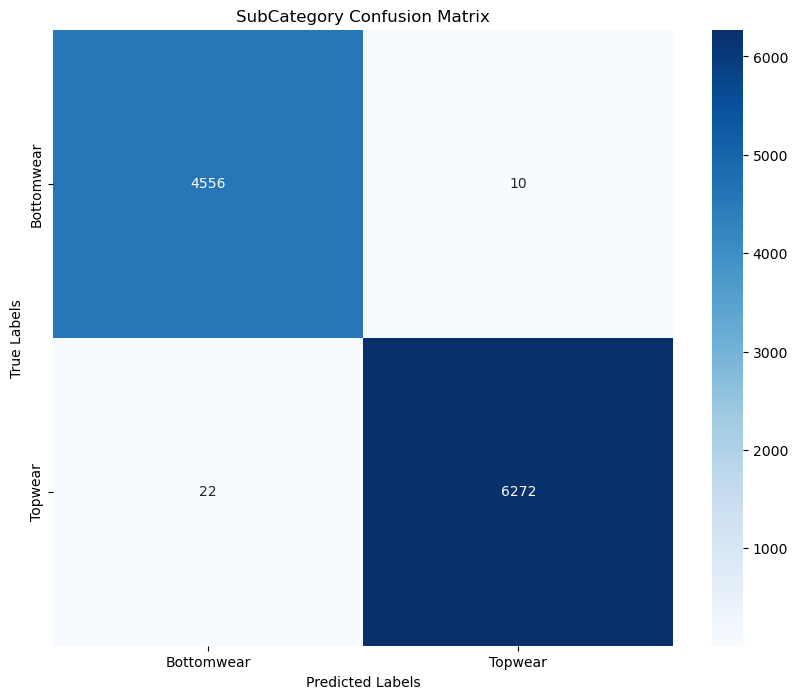

SubCategory Classification Report:

              precision    recall  f1-score   support

  Bottomwear       1.00      1.00      1.00      4566
     Topwear       1.00      1.00      1.00      6294

    accuracy                           1.00     10860
   macro avg       1.00      1.00      1.00     10860
weighted avg       1.00      1.00      1.00     10860



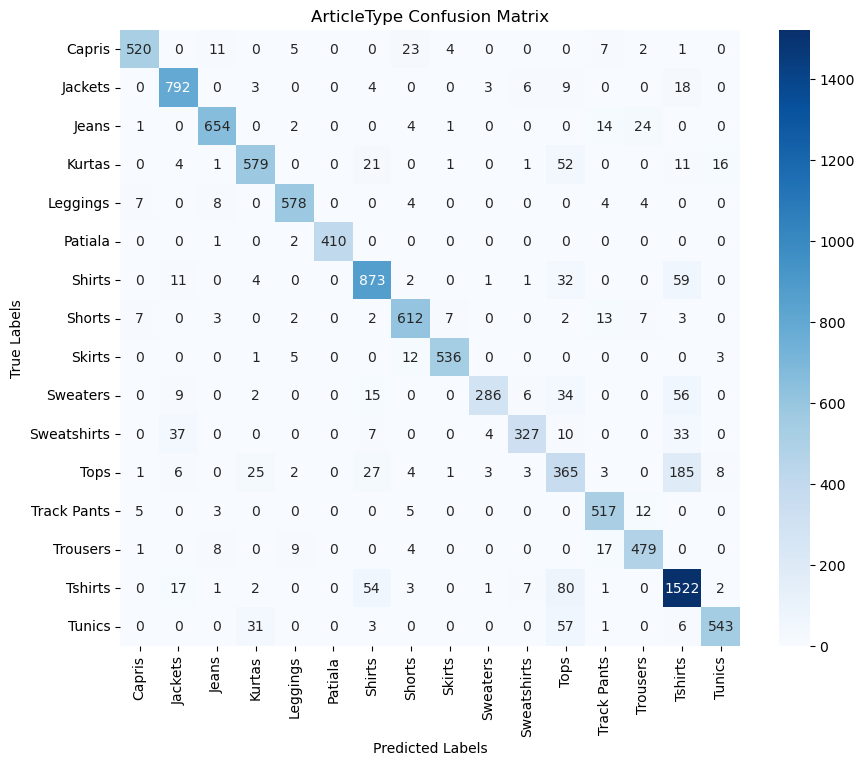

ArticleType Classification Report:

              precision    recall  f1-score   support

      Capris       0.96      0.91      0.93       573
     Jackets       0.90      0.95      0.93       835
       Jeans       0.95      0.93      0.94       700
      Kurtas       0.89      0.84      0.87       686
    Leggings       0.96      0.96      0.96       605
     Patiala       1.00      0.99      1.00       413
      Shirts       0.87      0.89      0.88       983
      Shorts       0.91      0.93      0.92       658
      Skirts       0.97      0.96      0.97       557
    Sweaters       0.96      0.70      0.81       408
 Sweatshirts       0.93      0.78      0.85       418
        Tops       0.57      0.58      0.57       633
 Track Pants       0.90      0.95      0.92       542
    Trousers       0.91      0.92      0.92       518
     Tshirts       0.80      0.90      0.85      1690
      Tunics       0.95      0.85      0.90       641

    accuracy                           0.88 

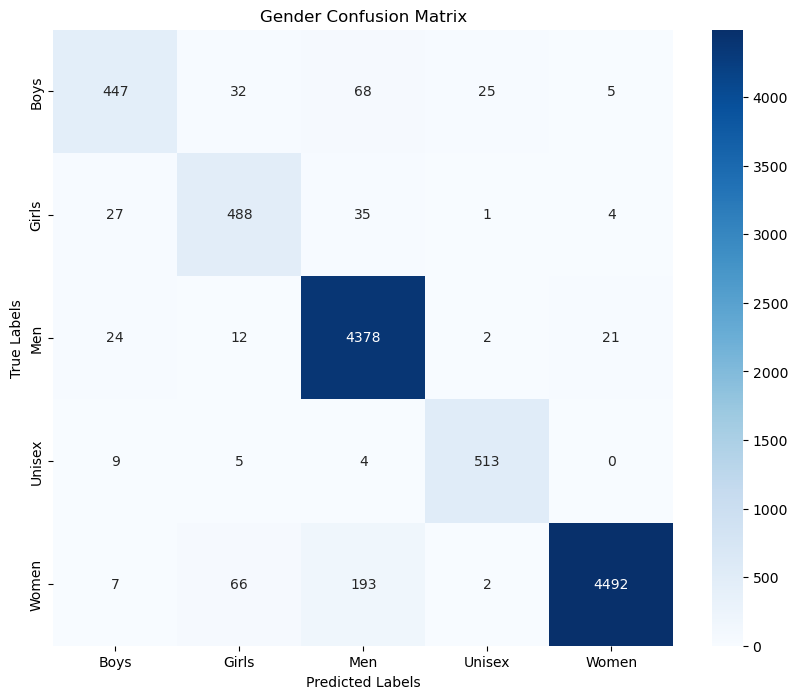

Gender Classification Report:

              precision    recall  f1-score   support

        Boys       0.87      0.77      0.82       577
       Girls       0.81      0.88      0.84       555
         Men       0.94      0.99      0.96      4437
      Unisex       0.94      0.97      0.96       531
       Women       0.99      0.94      0.97      4760

    accuracy                           0.95     10860
   macro avg       0.91      0.91      0.91     10860
weighted avg       0.95      0.95      0.95     10860



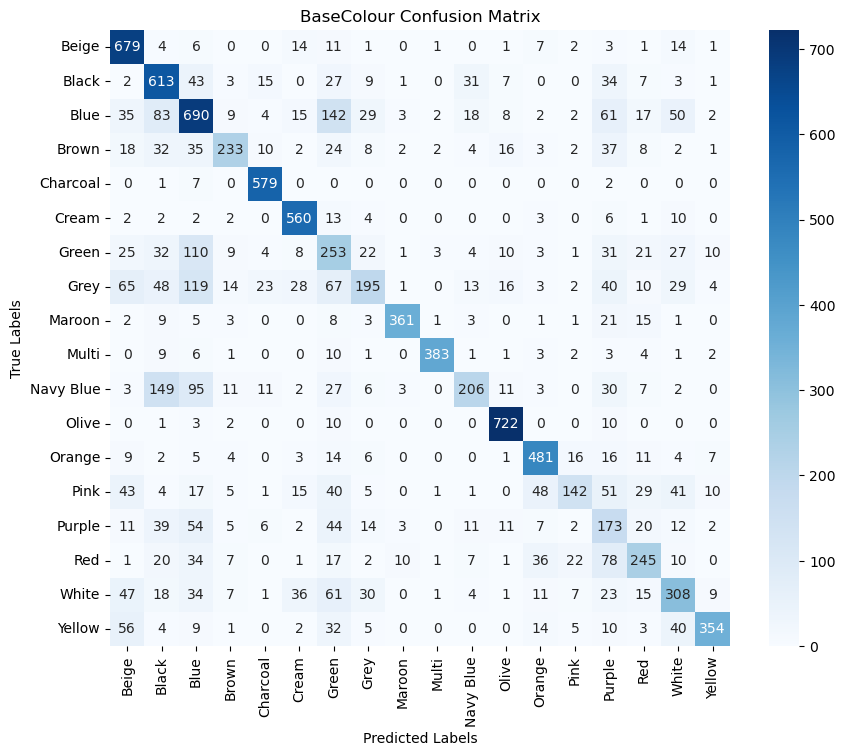

BaseColour Classification Report:

              precision    recall  f1-score   support

       Beige       0.68      0.91      0.78       745
       Black       0.57      0.77      0.66       796
        Blue       0.54      0.59      0.56      1172
       Brown       0.74      0.53      0.62       439
    Charcoal       0.89      0.98      0.93       589
       Cream       0.81      0.93      0.87       605
       Green       0.32      0.44      0.37       574
        Grey       0.57      0.29      0.38       677
      Maroon       0.94      0.83      0.88       434
       Multi       0.97      0.90      0.93       427
   Navy Blue       0.68      0.36      0.47       566
       Olive       0.90      0.97      0.93       748
      Orange       0.77      0.83      0.80       579
        Pink       0.69      0.31      0.43       453
      Purple       0.28      0.42      0.33       416
         Red       0.59      0.50      0.54       492
       White       0.56      0.50      0.53   

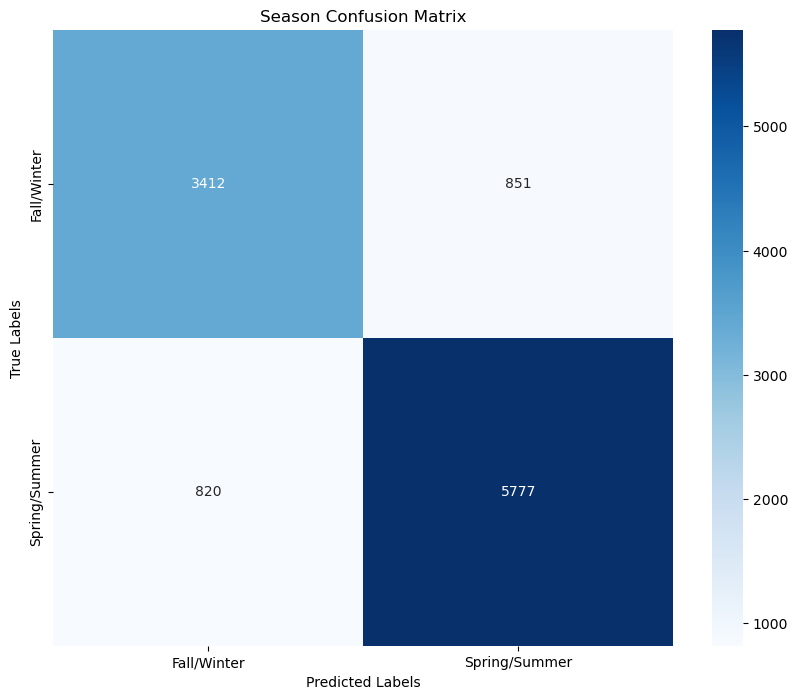

Season Classification Report:

               precision    recall  f1-score   support

  Fall/Winter       0.81      0.80      0.80      4263
Spring/Summer       0.87      0.88      0.87      6597

     accuracy                           0.85     10860
    macro avg       0.84      0.84      0.84     10860
 weighted avg       0.85      0.85      0.85     10860



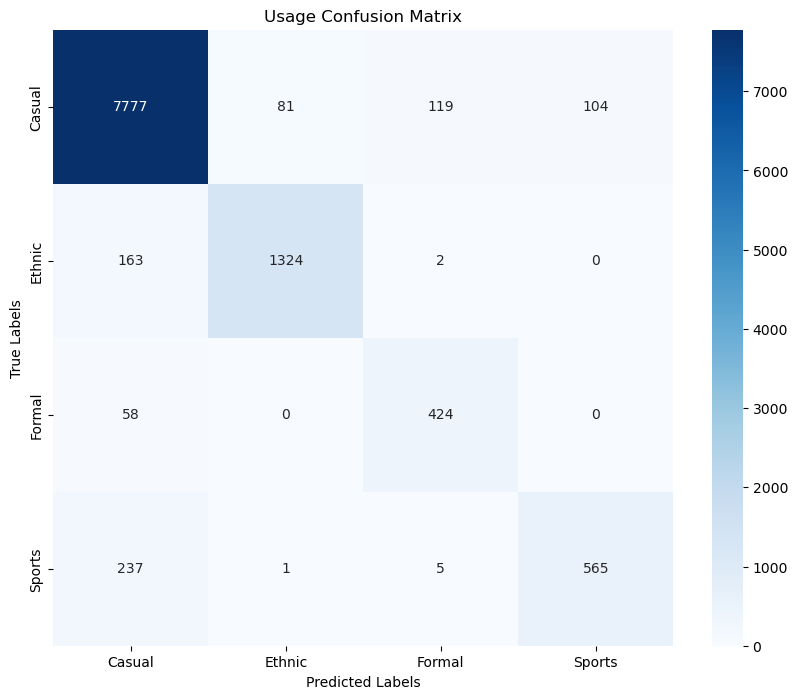

Usage Classification Report:

              precision    recall  f1-score   support

      Casual       0.94      0.96      0.95      8081
      Ethnic       0.94      0.89      0.91      1489
      Formal       0.77      0.88      0.82       482
      Sports       0.84      0.70      0.77       808

    accuracy                           0.93     10860
   macro avg       0.88      0.86      0.86     10860
weighted avg       0.93      0.93      0.93     10860



In [10]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go


output = ["SubCategory", "ArticleType", "Gender", "BaseColour", "Season", "Usage"]

for i, y_pred_output in enumerate(y_pred):
    
    y_true_output = y_true[i]  # Get the corresponding true labels for this output
    if y_pred_output.shape[1] == 1:
        y_pred_labels = (np.squeeze(y_pred_output) >= 0.5).astype(int)
    else:
        y_pred_labels = np.argmax(y_pred_output, axis=1)  # Convert predicted probabilities to labels
    
    # Confusion Matrix
    # Generate confusion matrix
    cm = confusion_matrix(y_true_output, y_pred_labels)
    # Plot confusion matrix using seaborn heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=target_names[i], yticklabels=target_names[i])
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(output[i] + " Confusion Matrix")
    plt.show()
    
    # Classification Report
    print(output[i], "Classification Report:\n")
    # Print classification report for this output
    print(classification_report(y_true_output, y_pred_labels, labels=np.unique(y_true_output), 
                                target_names=target_names[i], zero_division=0))
    
    # ROC Curve - AUC
    fig = go.Figure()
    if len(target_names[i]) == 2:
        # Reshape y_pred_output to match the shape of y_true_output
        y_pred_output = y_pred_output.reshape(-1)  # Flatten to 1D array

        # Calculate ROC curve
        fpr, tpr, _ = roc_curve(y_true_output, y_pred_output)
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve
        fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'ROC curve (AUC = {roc_auc:.2f})'))
    
    if len(target_names[i]) > 2:  # Multiclass case
        # Calculate ROC curve for each class in the current output
        fpr = dict()
        tpr = dict()
        roc_auc = dict()

        for class_idx in range(len(target_names[i])):
            fpr[class_idx], tpr[class_idx], _ = roc_curve(y_true_output == class_idx, y_pred_output[:, class_idx])
            roc_auc[class_idx] = auc(fpr[class_idx], tpr[class_idx])

        # Plot ROC curves for each class
        for class_idx in range(len(target_names[i])):
            fig.add_trace(go.Scatter(x=fpr[class_idx], y=tpr[class_idx], mode='lines',
                                     name=f'{target_names[i][class_idx]} (AUC = {roc_auc[class_idx]:.2f})'))

    fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', line=dict(dash='dash', color="black"), name='Random Guess'))

    fig.update_layout(
        title=f'{output[i]} ROC Curve',
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate',
        xaxis=dict(range=[0, 1]),
        yaxis=dict(range=[0, 1]),
        legend=dict(x=1, y=0, traceorder='normal'),
        plot_bgcolor='#F4F5F3',
    )

    fig.show()